**"On the Importance of Initialization and Momentum in Deep Learning"** by Sutskever et al. 

## Visualization of Momentum Methods in Deep Learning

This notebook accompanies the paper *"On the Importance of Initialization and Momentum in Deep Learning"* by Sutskever et al.  
We visualize:
1. Classical Momentum (CM) vs. Nesterov’s Accelerated Gradient (NAG)
2. Eigenvalue-Dependent Momentum Scaling
3. Optimization Trajectories on a Quadratic Loss

### **1. Classical Momentum (CM) vs. Nesterov’s Accelerated Gradient (NAG)**

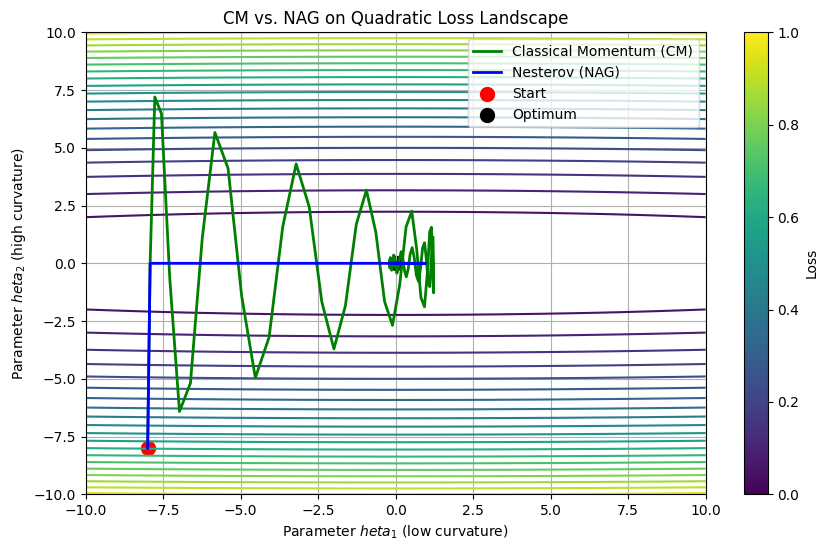

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Define a quadratic loss function: f(x) = x^T A x / 2 + b^T x
A = np.diag([1, 100])  # High condition number (100:1)
b = np.zeros(2)

def loss(x):
    return 0.5 * x.T @ A @ x + b.T @ x

def grad(x):
    return A @ x + b

# CM and NAG update rules
def cm_update(x, v, mu, lr):
    v_new = mu * v - lr * grad(x)
    x_new = x + v_new
    return x_new, v_new

def nag_update(x, v, mu, lr):
    v_new = mu * v - lr * grad(x + mu * v)
    x_new = x + v_new
    return x_new, v_new

# Simulate optimization
def simulate(update_fn, x0, v0, mu, lr, steps):
    x, v = x0.copy(), v0.copy()
    trajectory = [x.copy()]
    for _ in range(steps):
        x, v = update_fn(x, v, mu, lr)
        trajectory.append(x.copy())
    return np.array(trajectory)

# Parameters
x0 = np.array([-8.0, -8.0])  # Initial point
v0 = np.zeros(2)             # Initial velocity
mu = 0.9                     # Momentum coefficient
lr = 0.01                    # Learning rate
steps = 100                  # Optimization steps

# Simulate trajectories
traj_cm = simulate(cm_update, x0, v0, mu, lr, steps)
traj_nag = simulate(nag_update, x0, v0, mu, lr, steps)

# Plot the loss landscape
x1, x2 = np.meshgrid(np.linspace(-10, 10, 100), np.linspace(-10, 10, 100))
X = np.vstack([x1.ravel(), x2.ravel()]).T
Z = np.array([loss(x) for x in X]).reshape(x1.shape)

plt.figure(figsize=(10, 6))
plt.contour(x1, x2, Z, levels=20, cmap='viridis')
plt.plot(traj_cm[:, 0], traj_cm[:, 1], 'g-', label='Classical Momentum (CM)', linewidth=2)
plt.plot(traj_nag[:, 0], traj_nag[:, 1], 'b-', label='Nesterov (NAG)', linewidth=2)
plt.scatter(*x0, c='red', s=100, label='Start')
plt.scatter(0, 0, c='black', s=100, label='Optimum')
plt.xlabel('Parameter $\theta_1$ (low curvature)')
plt.ylabel('Parameter $\theta_2$ (high curvature)')
plt.title('CM vs. NAG on Quadratic Loss Landscape')
plt.legend()
plt.colorbar(label='Loss')
plt.grid()
plt.show()

### **Key Insight**:  
### - NAG (blue) corrects overshooting in high-curvature directions ($\theta_2$) better than CM (green).  
### - CM exhibits oscillations, while NAG converges more smoothly.

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

### **2. Eigenvalue-Dependent Momentum Scaling (Theorem 2.1)**
### Effective momentum: μ_eff = μ(1 - λε)

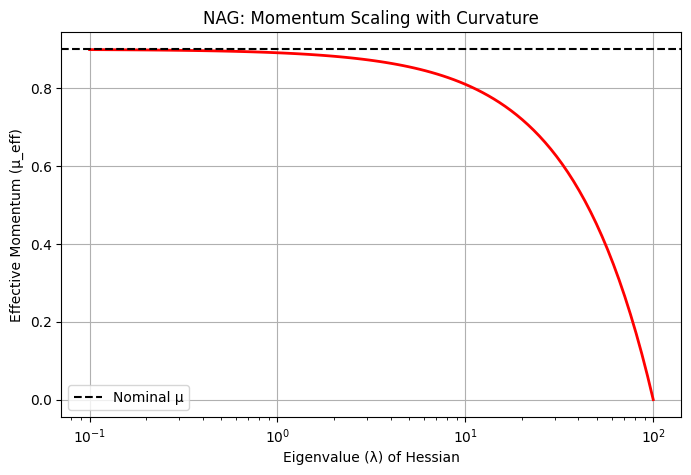

In [6]:
eigenvalues = np.logspace(-1, 2, 100)  # λ (curvature)
lr = 0.01
mu = 0.9
mu_eff = mu * (1 - eigenvalues * lr)

plt.figure(figsize=(8, 5))
plt.semilogx(eigenvalues, mu_eff, 'r-', linewidth=2)
plt.axhline(mu, linestyle='--', color='k', label='Nominal μ')
plt.xlabel('Eigenvalue (λ) of Hessian')
plt.ylabel('Effective Momentum (μ_eff)')
plt.title('NAG: Momentum Scaling with Curvature')
plt.legend()
plt.grid()
plt.show()

### **Key Insight**:  
### - For high-curvature directions (large $\lambda$), NAG reduces $\mu_{\text{eff}}$ (avoiding oscillations).  
### - For low-curvature directions (small $\lambda$), NAG preserves momentum.

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

### **3. Optimization Trajectories (Animation)**

In [9]:
# Animate the optimization process
fig, ax = plt.subplots(figsize=(8, 8))
ax.contour(x1, x2, Z, levels=20, cmap='viridis')
ax.set_xlabel('$\theta_1$'); ax.set_ylabel('$\theta_2$')
ax.set_title('Optimization Trajectories')

cm_line, = ax.plot([], [], 'g-', label='CM')
nag_line, = ax.plot([], [], 'b-', label='NAG')
start_point = ax.scatter([], [], c='red', s=100)
opt_point = ax.scatter(0, 0, c='black', s=100)
ax.legend()

def init():
    cm_line.set_data([], [])
    nag_line.set_data([], [])
    start_point.set_offsets(x0.reshape(1, -1))
    return cm_line, nag_line, start_point

def animate(i):
    cm_line.set_data(traj_cm[:i, 0], traj_cm[:i, 1])
    nag_line.set_data(traj_nag[:i, 0], traj_nag[:i, 1])
    return cm_line, nag_line

ani = FuncAnimation(fig, animate, frames=steps, init_func=init, blit=True, interval=100)
plt.close()
HTML(ani.to_jshtml())

### **Interactive Insight**:  
### - Run the animation to see how NAG (blue) "anticipates" corrections compared to CM (green).  

### **Summary**
##### - **NAG > CM**: More stable convergence due to curvature-aware momentum.  
##### - **Initialization Matters**: Poorly initialized networks fail to train even with momentum.  
##### - **Momentum Schedule**: Increasing $\mu$ gradually improves performance (Eq. 5 in the paper).  
##### Try adjusting `mu` and `lr` in the code to see their impact!

Works fine   +++++++ End of Paper 1 +++++++